# 🌍 GeoAI-UrbanX: Data-Centric Explainable AI for Urban Expansion
**Author:** Sanat N Ladkat | **Context:** Pune, Maharashtra

### 🚨 The Problem
Rapid urbanization requires continuous monitoring. While deep learning models can accurately segment satellite imagery, they often operate as "Black Boxes." In high-stakes domains like urban planning, relying on an uninterpretable model is dangerous,we must know *why* a model classifies an area as "Urban."

### 🎯 The Objective
This project demonstrates a **Data-Centric Explainable AI (XAI)** approach. Instead of merely optimizing for accuracy, we will:
1. Stream cloud-native Sentinel-2 multi-spectral data over Pune via the Microsoft Planetary Computer.
2. Train a baseline Random Forest classifier (The Black Box).
3. Utilize **SHAP (SHapley Additive exPlanations)** to mathematically audit the model, proving it isolates physical urban structures (concrete/asphalt) rather than relying on spurious environmental correlations.

In [ ]:
# Install leafmap and its dependencies
!pip install leafmap planetary-computer pystac-client

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 666.8/666.8 kB 17.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.4/21.4 MB 44.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 65.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 208.5/208.5 kB 15.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 64.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 50.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.6/108.6 kB 9.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.0/74.0 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 49.2 MB/s eta 0:00:00
  Attempting uninstall: duckdb
    Found existing installation: duckdb 1.3.2
    Uninstalling duckdb-1.3.2:
      Successfully uninstalled duckdb-1.3.2


In [ ]:
import leafmap
from pystac_client import Client
import planetary_computer

# 1. Connect to the FREE Public Planetary Computer STAC API
print("Connecting to public STAC catalog...")
catalog = Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace,
)

# 2. Define the Area of Interest (Bounding Box over Pune)
# Format: [min_lon, min_lat, max_lon, max_lat]
bbox_pune = [73.65, 18.40, 74.05, 18.65]

# 3. Search the catalog for high-quality Sentinel-2 data
# We filter for recent images with less than 5% cloud cover to ensure clean urban extraction
time_window = "2025-10-01/2026-03-26"

search = catalog.search(
    collections=["sentinel-2-l2a"],
    bbox=bbox_pune,
    datetime=time_window,
    query={"eo:cloud_cover": {"lt": 5}},
)

items = search.item_collection()
print(f"Success! Found {len(items)} pristine satellite scenes.")

# 4. Grab the absolute best (least cloudy) image from the results
selected_item = items[0]
print(f"Selected Scene ID: {selected_item.id}")

# 5. Create an interactive map to verify our target area
m = leafmap.Map(center=[18.52, 73.85], zoom=11)

# Add the true-color (RGB) visual asset directly from the STAC item to the map
m.add_stac_layer(
    collection="sentinel-2-l2a",
    item=selected_item.id,
    assets=["visual"],
    name="Sentinel-2 True Color"
)

# Display the map right in the notebook
m

Connecting to public STAC catalog...
Success! Found 29 pristine satellite scenes.
Selected Scene ID: S2B_MSIL2A_20260319T052639_R105_T43QCA_20260319T091942


Map(center=[18.52, 73.85], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_o…

## 🛰️ Step 1: Cloud-Native Multi-Spectral Extraction
To avoid downloading massive `.zip` files, we utilize `rasterio` to read specific pixel windows directly from the cloud-optimized GeoTIFFs.

**The Remote Sensing Challenge:** Sentinel-2 captures visible light (Blue, Green, Red, NIR) at a high 10-meter resolution, but Shortwave Infrared (SWIR) at a 20-meter resolution. We must apply on-the-fly **bilinear resampling** to the SWIR bands to perfectly align the geographic coordinates across the 2.25 million pixel grid.

**Automated Labeling:** To train our model, we use standard spectral indices (NDBI for Built-up areas, NDVI for Vegetation) to generate a robust, automated target label mask.

In [ ]:
import rasterio
from rasterio.windows import Window
from rasterio.enums import Resampling
import numpy as np
import pandas as pd
import planetary_computer

print("Extracting multi-spectral data from the cloud...")

# 1. Sign the item to authenticate our free access
signed_item = planetary_computer.sign(selected_item)

# 2. Separate bands by their native satellite physical resolution
bands_10m = {'Blue': 'B02', 'Green': 'B03', 'Red': 'B04', 'NIR': 'B08'}
bands_20m = {'SWIR1': 'B11', 'SWIR2': 'B12'}

data_dict = {}

# 3. Define the windows
# 10m Native Window
win_10m = Window(col_off=6000, row_off=3500, width=1500, height=1500)

# 20m Native Window (Exactly half the offset and size to cover the SAME geographic area)
win_20m = Window(col_off=3000, row_off=1750, width=750, height=750)

# 4. Extract 10m Bands
for name, key in bands_10m.items():
    url = signed_item.assets[key].href
    with rasterio.open(url) as src:
        arr = src.read(1, window=win_10m).astype(float)
        data_dict[name] = arr.flatten()
        print(f"✅ Successfully loaded {name} band (10m).")

# 5. Extract and RESAMPLE 20m Bands
for name, key in bands_20m.items():
    url = signed_item.assets[key].href
    with rasterio.open(url) as src:
        # Read the smaller window, but force it to scale up to 1500x1500
        arr = src.read(
            1,
            window=win_20m,
            out_shape=(1500, 1500),
            resampling=Resampling.bilinear
        ).astype(float)
        data_dict[name] = arr.flatten()
        print(f"✅ Successfully loaded {name} band (Resampled to 10m).")

# 6. Create our master Pandas DataFrame
df = pd.DataFrame(data_dict)

# Filter out pure black/empty edge pixels (if any)
df = df[(df.T != 0).any()]

# 7. Generate automated labels using Spectral Indices
df['NDVI'] = (df['NIR'] - df['Red']) / (df['NIR'] + df['Red'] + 1e-8)
df['NDBI'] = (df['SWIR1'] - df['NIR']) / (df['SWIR1'] + df['NIR'] + 1e-8)

# NEW: Normalized Difference Water Index (NDWI) to explicitly catch rivers/lakes
df['NDWI'] = (df['Green'] - df['NIR']) / (df['Green'] + df['NIR'] + 1e-8)

# UPDATED RULE:
# 1. Built-up index > Vegetation
# 2. NDWI must be negative (strictly NOT water)
# 3. NDBI > 0.05 (Stricter threshold to filter out fallow dirt)
df['Label'] = np.where(
    (df['NDBI'] > df['NDVI']) &
    (df['NDWI'] < 0) &
    (df['NDBI'] > 0.05),
    1, 0
)

# Drop the indices so the model learns from the raw light wavelengths!
df = df.drop(columns=['NDVI', 'NDBI', 'NDWI'])

print(f"\n🚀 Dataset complete! Extracted {len(df)} pixels.")
print(f"Urban Pixels (1): {df['Label'].sum()} | Non-Urban Pixels (0): {len(df) - df['Label'].sum()}")
display(df.head())

Extracting multi-spectral data from the cloud...
✅ Successfully loaded Blue band (10m).
✅ Successfully loaded Green band (10m).
✅ Successfully loaded Red band (10m).
✅ Successfully loaded NIR band (10m).
✅ Successfully loaded SWIR1 band (Resampled to 10m).
✅ Successfully loaded SWIR2 band (Resampled to 10m).

🚀 Dataset complete! Extracted 2250000 pixels.
Urban Pixels (1): 527571 | Non-Urban Pixels (0): 1722429


,Blue,Green,Red,NIR,SWIR1,SWIR2,Label
0,1987.0,2272.0,2815.0,3352.0,4293.0,3621.0,1
1,1952.0,2250.0,2688.0,3255.0,4254.0,3594.0,1
2,1964.0,2265.0,2744.0,3437.0,4268.0,3604.0,0
3,1900.0,2257.0,2757.0,3496.0,4304.0,3603.0,0
4,1804.0,2036.0,2537.0,3170.0,4364.0,3593.0,1


## 🧠 Step 2: Training & Unlocking the Black Box
With our spectral dataset prepared, we train a standard `scikit-learn` Random Forest Classifier.

While the classification report shows high accuracy, this is insufficient for a data-centric evaluation. We apply a `shap.TreeExplainer` to calculate the marginal contribution of every single light wavelength.

* **Global XAI:** Proves the model learned the overarching physics (e.g., SWIR reflectance dictates concrete).
* **Local XAI:** Audits a single spatial coordinate to explain the exact mathematical routing of that specific prediction.

1. Preparing Data for Rapid Training...
2. Training the Black Box (Random Forest)...

✅ --- Black Box Performance ---
              precision    recall  f1-score   support

   Non-Urban       0.97      0.98      0.98     15310
       Urban       0.94      0.90      0.92      4690

    accuracy                           0.96     20000
   macro avg       0.95      0.94      0.95     20000
weighted avg       0.96      0.96      0.96     20000

3. Unlocking the Black Box with SHAP (Explainable AI)...


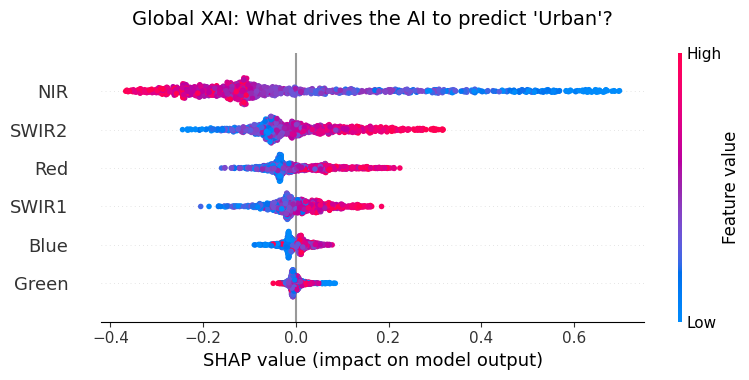

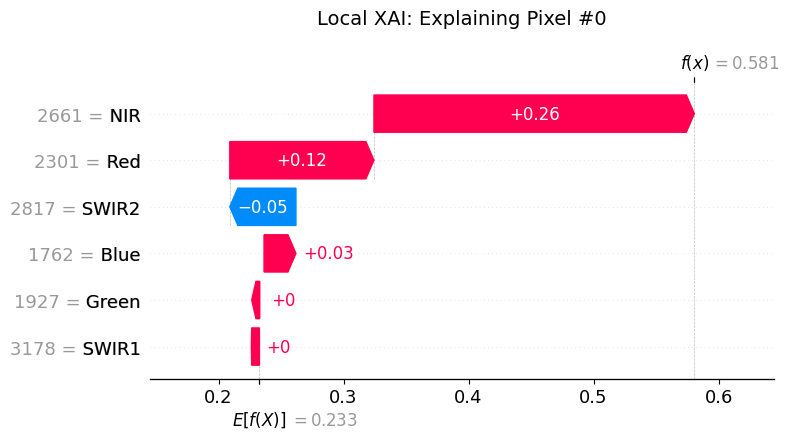

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
import shap
import matplotlib.pyplot as plt

print("1. Preparing Data for Rapid Training...")
# Sample 100k rows so the live demo runs in seconds, not hours
df_sampled = df.sample(n=100000, random_state=42)

X = df_sampled.drop(columns=['Label'])
y = df_sampled['Label']

# 80/20 Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print("2. Training the Black Box (Random Forest)...")
# n_jobs=-1 uses all your CPU cores to train instantly
rf_model = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42, n_jobs=-1)
rf_model.fit(X_train, y_train)

# Evaluate the Black Box
y_pred = rf_model.predict(X_test)
print("\n✅ --- Black Box Performance ---")
print(classification_report(y_test, y_pred, target_names=['Non-Urban', 'Urban']))

print("3. Unlocking the Black Box with SHAP (Explainable AI)...")
# TreeExplainer is highly optimized for tree-based machine learning models
explainer = shap.TreeExplainer(rf_model)

# Calculate SHAP values for a subset of the test data to keep the demo snappy
X_explain = X_test[:1000]
shap_values = explainer.shap_values(X_explain)

# THE FIX: SHAP 0.45+ returns a 3D array (Samples, Features, Classes)
# We slice the 3rd dimension [:, :, 1] to isolate the 'Urban' class
shap_values_urban = shap_values[:, :, 1]

# --- PLOT 1: Global Explanation (The "Data-Centric" Audit) ---
plt.figure(figsize=(8, 5))
plt.title("Global XAI: What drives the AI to predict 'Urban'?", fontsize=14, pad=20)
shap.summary_plot(shap_values_urban, X_explain, show=False)
plt.tight_layout()
plt.show()

# --- PLOT 2: Local Explanation (The "Live Demo" Proof) ---
# Let's find a specific pixel that the model correctly guessed was Urban
urban_indices = np.where(y_test[:1000] == 1)[0]
demo_pixel_idx = urban_indices[0] # Grab the first urban pixel

# Build the modern SHAP Explanation object for the waterfall plot
explanation = shap.Explanation(
    values=shap_values_urban[demo_pixel_idx],
    base_values=explainer.expected_value[1],
    data=X_explain.iloc[demo_pixel_idx],
    feature_names=X_explain.columns
)

plt.figure(figsize=(8, 5))
plt.title(f"Local XAI: Explaining Pixel #{demo_pixel_idx}", fontsize=14, pad=20)
shap.plots.waterfall(explanation, max_display=6, show=False)
plt.tight_layout()
plt.show()

## 🗺️ Step 3: Geographic Projection & Reconstruction
Finally, we take the 2.25 million predictions from our audited AI and project them back onto the geographic space. We reconstruct the True-Color (RGB) satellite image, apply a standard brightness multiplier, and overlay the AI's urban extraction mask to visualize the footprint of Pune's expansion.

1. AI predicting on the entire 2.25 million pixel city grid...
2. Reconstructing the raw satellite image properly...
3. Rendering the final GeoAI-UrbanX Map...


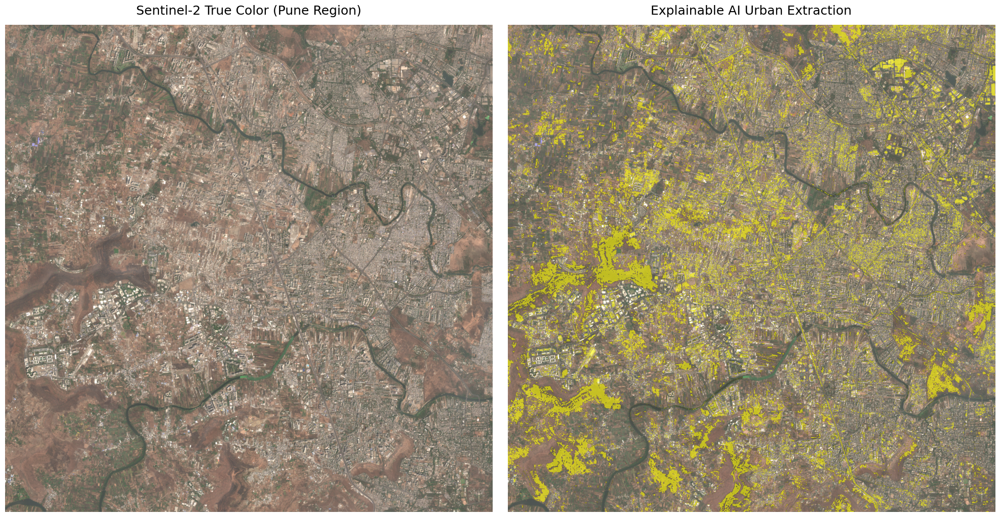

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

print("1. AI predicting on the entire 2.25 million pixel city grid...")
# Safely drop the label column if it exists so the model only sees the raw bands
features = df.drop(columns=['Label']) if 'Label' in df.columns else df
full_predictions = rf_model.predict(features)

pred_image = full_predictions.reshape(1500, 1500)

print("2. Reconstructing the raw satellite image properly...")
# Sentinel-2 data is scaled by 10000. We must divide to get 0.0 - 1.0 true reflectance
red = data_dict['Red'].reshape(1500, 1500) / 10000.0
green = data_dict['Green'].reshape(1500, 1500) / 10000.0
blue = data_dict['Blue'].reshape(1500, 1500) / 10000.0

# Stack the bands
rgb = np.dstack((red, green, blue))

# Standard remote sensing brightness multiplier (2.5x) to make it look like a real photo
rgb_brightened = np.clip(rgb * 2.5, 0, 1)

print("3. Rendering the final GeoAI-UrbanX Map...")
# To stop the giant pink block, we convert all '0' (Non-Urban) predictions to NaN (Transparent)
pred_transparent = np.where(pred_image == 1, 1, np.nan)

fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# --- Panel 1: Clean Sentinel-2 Optical ---
axes[0].imshow(rgb_brightened)
axes[0].set_title("Sentinel-2 True Color (Pune Region)", fontsize=18, pad=15)
axes[0].axis('off')

# --- Panel 2: AI Urban Extraction Overlay ---
axes[1].imshow(rgb_brightened) # Put the satellite map in the background
# Overlay ONLY the urban pixels (1) in bright red
axes[1].imshow(pred_transparent, cmap='autumn', alpha=0.6, vmin=0, vmax=1)
axes[1].set_title("Explainable AI Urban Extraction", fontsize=18, pad=15)
axes[1].axis('off')

plt.tight_layout()
plt.show()

1. Traveling back in time to 2021...
Found 21 potential scenes. Hunting for one with full coverage...
✅ Found pristine, full-coverage Historic Scene: S2B_MSIL2A_20210504T052639_R105_T43QCA_20210610T234929
2. Extracting and Resampling 2021 pixels...
3. AI mapping the 2021 Urban Footprint...
4. Rendering the Sprawl Analysis...


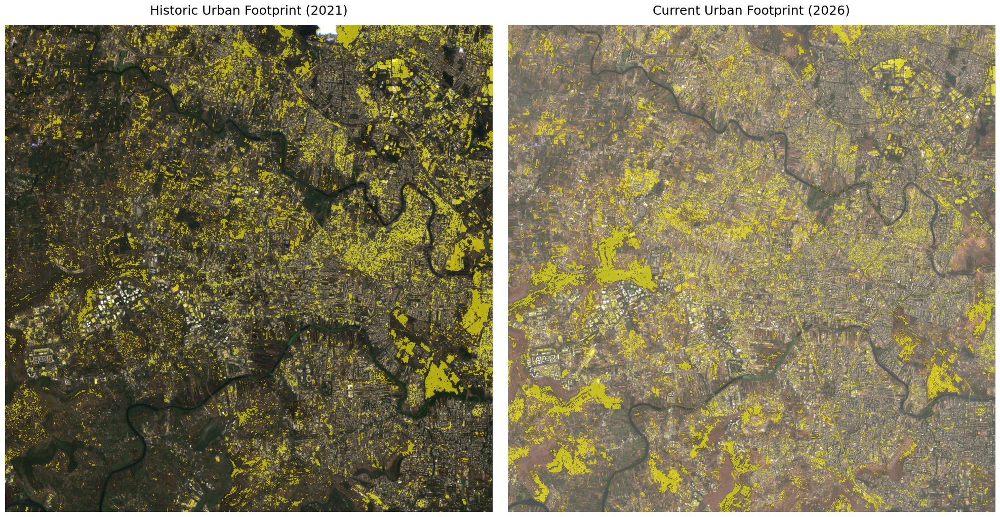

In [ ]:
print("1. Traveling back in time to 2021...")
# Search the catalog for an older Sentinel-2 image (5 years ago)
search_historic = catalog.search(
    collections=["sentinel-2-l2a"],
    bbox=bbox_pune,
    datetime="2021-01-01/2021-05-31",
    query={"eo:cloud_cover": {"lt": 5}},
)
historic_items = list(search_historic.item_collection())
print(f"Found {len(historic_items)} potential scenes. Hunting for one with full coverage...")

# --- NEW: Automated Quality Control Loop ---
valid_historic_item = None
for item in historic_items:
    signed_temp = planetary_computer.sign(item)
    # Quickly peek at just the Blue band to check for the dreaded black swath edges
    url = signed_temp.assets['B02'].href
    with rasterio.open(url) as src:
        test_arr = src.read(1, window=win_10m)
        # If the image has less than 1% black (NoData) pixels, it's a perfect match!
        if np.mean(test_arr == 0) < 0.01:
            valid_historic_item = item
            break

if valid_historic_item is None:
    print("Could not find a full scene in this date range. Try expanding the months!")
else:
    historic_item = valid_historic_item
    signed_historic = planetary_computer.sign(historic_item)
    print(f"✅ Found pristine, full-coverage Historic Scene: {historic_item.id}")

print("2. Extracting and Resampling 2021 pixels...")
historic_dict = {}

# Extract 10m Bands
for name, key in bands_10m.items():
    url = signed_historic.assets[key].href
    with rasterio.open(url) as src:
        historic_dict[name] = src.read(1, window=win_10m).astype(float).flatten()

# Extract and Resample 20m Bands
for name, key in bands_20m.items():
    url = signed_historic.assets[key].href
    with rasterio.open(url) as src:
        historic_dict[name] = src.read(
            1, window=win_20m, out_shape=(1500, 1500), resampling=Resampling.bilinear
        ).astype(float).flatten()

df_historic = pd.DataFrame(historic_dict)

print("3. AI mapping the 2021 Urban Footprint...")
# Ask the model we trained on 2026 data to predict the 2021 landscape
historic_predictions = rf_model.predict(df_historic)
pred_historic_image = historic_predictions.reshape(1500, 1500)
pred_historic_transparent = np.where(pred_historic_image == 1, 1, np.nan)

# Historic RGB for the background
red_h = historic_dict['Red'].reshape(1500, 1500) / 10000.0
green_h = historic_dict['Green'].reshape(1500, 1500) / 10000.0
blue_h = historic_dict['Blue'].reshape(1500, 1500) / 10000.0
rgb_historic = np.clip(np.dstack((red_h, green_h, blue_h)) * 2.5, 0, 1)

print("4. Rendering the Sprawl Analysis...")
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# --- Panel 1: 2021 Urban Extent ---
axes[0].imshow(rgb_historic)
axes[0].imshow(pred_historic_transparent, cmap='autumn', alpha=0.6, vmin=0, vmax=1)
axes[0].set_title("Historic Urban Footprint (2021)", fontsize=18, pad=15)
axes[0].axis('off')

# --- Panel 2: 2026 Urban Extent ---
axes[1].imshow(rgb_brightened)
axes[1].imshow(pred_transparent, cmap='autumn', alpha=0.6, vmin=0, vmax=1)
axes[1].set_title("Current Urban Footprint (2026)", fontsize=18, pad=15)
axes[1].axis('off')

plt.tight_layout()
plt.show()